# STFT domain fast RLS with deferred coefficients

In [9]:
import helper
import paths
import processing
import algorithms

import librosa
import librosa.core as lc
import matplotlib.pyplot as plt
import numpy as np
import scipy.signal as sc
from scipy.io.wavfile import write
from scipy.io.wavfile import read
import IPython

%reload_ext autoreload
%autoreload 2

# Case 1: Delayed inputs, speech on top

In [36]:
# samplerate, data = read("../data/alexa_single.wav")
# data1 = np.expand_dims(np.array(data), axis = 1)
# data2 = np.expand_dims(np.array(data), axis = 1)
# print(data1.shape)
# data3 = np.concatenate((data1, data2), axis=1)
# print(data3.shape)
# write("../data/alexa.wav", samplerate, data3)

# mean = 0
# std = 1 
# num_samples = len(data)
# samples = np.random.normal(mean, std, size=num_samples)*10000
# data1 = np.expand_dims(np.array(samples), axis = 1)
# data2 = np.expand_dims(np.array(samples), axis = 1)
# data3 = np.concatenate((data1, data2), axis=1)
# print(data3.shape)
# write("../data/while_noise.wav", samplerate, data3/2**15)
# # plt.plot(samples)
# # plt.show()

filename = 'while_noise'
speech_filename = 'alexa'

(149440, 1)
(149440, 2)
(149440, 2)


# Noise signal

In [37]:
signal_0, signal_1, fs = helper.load_separate_channels(filename)
IPython.display.Audio(data = signal_0, rate = fs)

(149440, 2)


# Speech signal

(149440, 2)


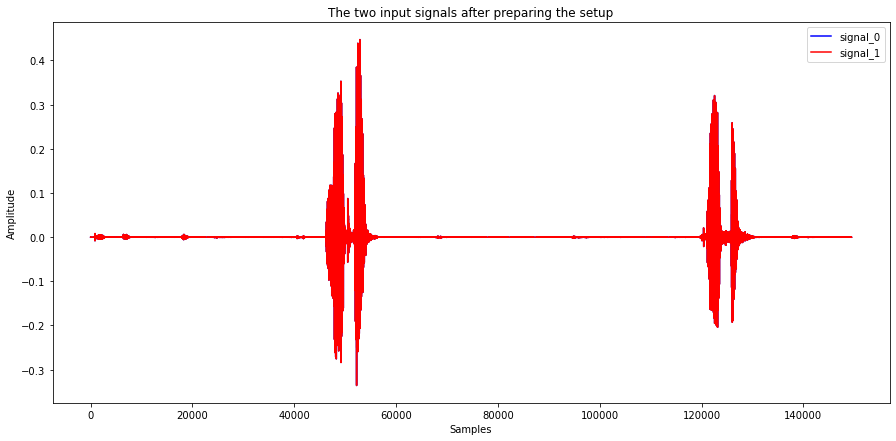

In [38]:
speech_signal, signal1, fs = helper.load_separate_channels(speech_filename)
IPython.display.Audio(data = speech_signal, rate = fs)
helper.plot_signals(speech_signal, signal1, 'The two input signals after preparing the setup', 'signal_0', 'signal_1')

First we load the signal into two different signals being the two channels.

Then we apply a **delay** similar to the one we would roughly have if the two microphones were separated by a certain distance (`6cm` here) by taking into account the sampling frequency (`32000 Hz` here).

On top of that, we add a **speech signal** at the same position for both inputs.

The current scenario represents a simple case in which the two inputs are only delayed one from another, the speech signal has no delay (we suppose that the speaker is in front of both microphones), and the same channel is applied to both (which is obviously not a realistic case).

Delay: 2 samples
(149440, 2)
Speech added at position same of the signal.


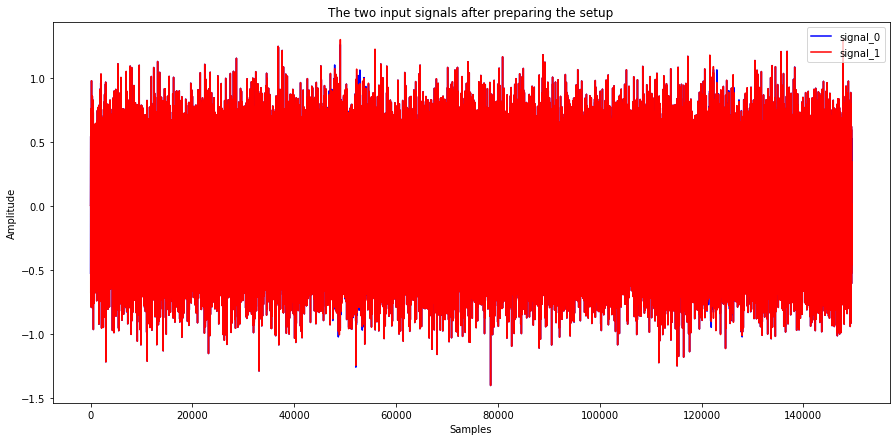

In [39]:
signal_0, signal_1 = processing.add_delay(0.06, fs, signal_0)
signal_0, signal_1 = processing.add_speech('alexa', signal_0, signal_1, amp=1, position='same')
helper.plot_signals(signal_0, signal_1, 'The two input signals after preparing the setup', 'signal_0', 'signal_1')

In [40]:
IPython.display.Audio(data = signal_0, rate = fs)

Next we compute the **STFT** for the two signals, with a pre-chosen `window_size` and `hop_percentage` which is the percentage of `window_size` we want to jump over for each consecutive frame.

## Short Time Fourier Transform

In [41]:
Zxx_0, Zxx_1, n_freqs, n_frames, hop_length = helper.dual_stft(signal_0, 
                                                               signal_1, 
                                                               window_size=4096, 
                                                               hop_percentage=50)

Number of frames: 73
Frequency resolution: 2049


## STFT domain fast RLS with deferred coefficients

Now we can run the **STFT domain fast RLS with deferred coefficients** algorithm with the parameters we choose.

In [42]:
epsilon = algorithms.stft_fast_rls_def_coefs(Zxx_0, Zxx_1, 
                                             d=12, 
                                             filter_length=3, 
                                             f_factor=0.993, 
                                             delta=0.1)

Progress: [####################] 100.0%


In [43]:
epsilon_time = lc.istft(epsilon, hop_length=hop_length)

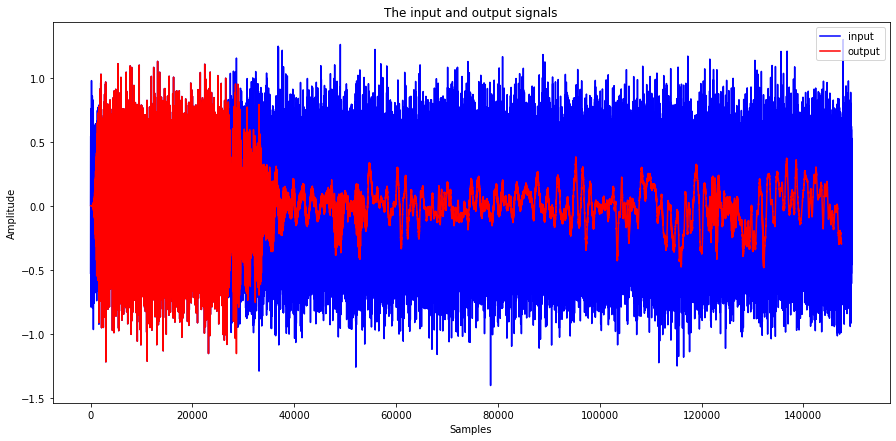

In [44]:
helper.plot_signals(signal_0, epsilon_time, 'The input and output signals', 'input', 'output')

Below are the spectrograms of the input signal and the output signal. You should be able to see the drop of magnitude after d frames in the second plot, which is the number of frames required to analyse the noise and then filter the signal with a delay of the deferred coefficients.

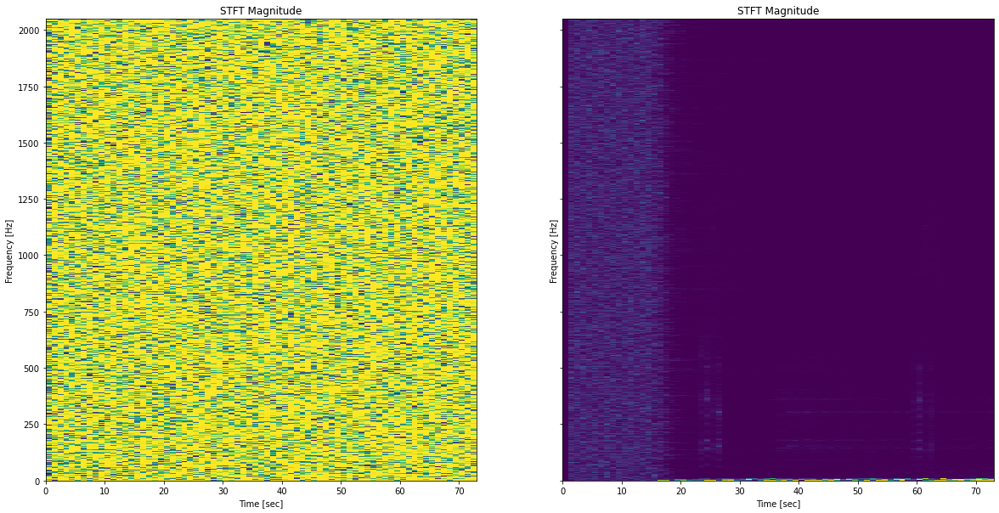

In [45]:
helper.spectrogram(Zxx_0, epsilon, 1/8)

In [46]:
IPython.display.Audio(data = epsilon_time, rate = fs)

# Case 2: Delayed inputs, speech on top, filtering with 1 Room Impulse Response

# Noise signal

In [44]:
signal_0, signal_1, fs = helper.load_separate_channels(filename)
IPython.display.Audio(data = signal_0, rate = fs)

# Speech signal

In [45]:
speech_signal, _, fs = helper.load_separate_channels(speech_filename)
IPython.display.Audio(data = speech_signal, rate = fs)

We apply a **delay** similar to the one we would roughly have if the two microphones were separated by a certain distance (`6cm` here) by taking into account the sampling frequency (`32000 Hz` here).

On top of that, we add a **speech signal** at the same position for both inputs.

Finally, we filter the first signal (the one wich has "no delay" introduced) with a `close_mic_rir` **Room Impulse Response** (RIR), simulating a close microphone, and the second signal with a `far_mic_rir` **Room Impulse Response** (RIR), simulating a far microphone.

Delay: 5 samples
Speech added at position mid of the signal.


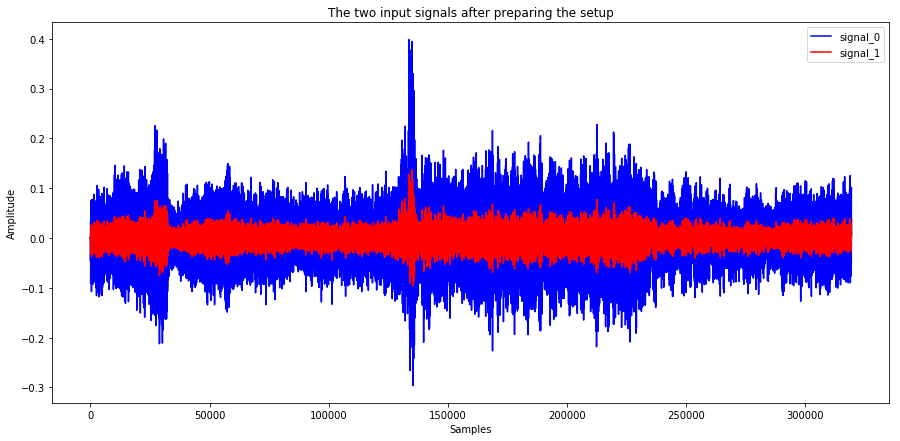

In [46]:
signal_0, signal_1 = processing.add_delay(0.06, fs, signal_0)
signal_0, signal_1 = processing.add_speech('alexa', signal_0, signal_1, amp=1, position='mid')
signal_0 = processing.rir_filter('close_mic_rir', 44100, signal_0, resampling_f=fs)
signal_1 = processing.rir_filter('far_mic_rir', 44100, signal_1, resampling_f=fs)
helper.plot_signals(signal_0, signal_1, 'The two input signals after preparing the setup', 'signal_0', 'signal_1')

In [47]:
IPython.display.Audio(data = signal_1, rate = fs)

## Short Time Fourier Transform

In [48]:
Zxx_0, Zxx_1, n_freqs, n_frames, hop_length = helper.dual_stft(signal_0, 
                                                               signal_1, 
                                                               window_size=4096, 
                                                               hop_percentage=50)

Number of frames: 156
Frequency resolution: 2049


## STFT domain fast RLS with deferred coefficients

In [49]:
epsilon = algorithms.stft_fast_rls_def_coefs(Zxx_0, Zxx_1, 
                                             d=12, 
                                             filter_length=3, 
                                             f_factor=0.993, 
                                             delta=0.1)

Progress: [####################] 100.0%


In [50]:
epsilon_time = lc.istft(epsilon, hop_length=hop_length)

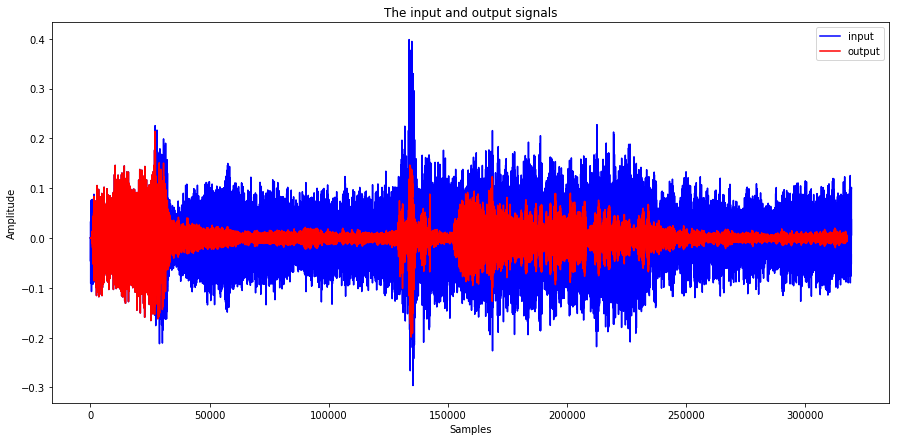

In [51]:
helper.plot_signals(signal_0, epsilon_time, 'The input and output signals', 'input', 'output')

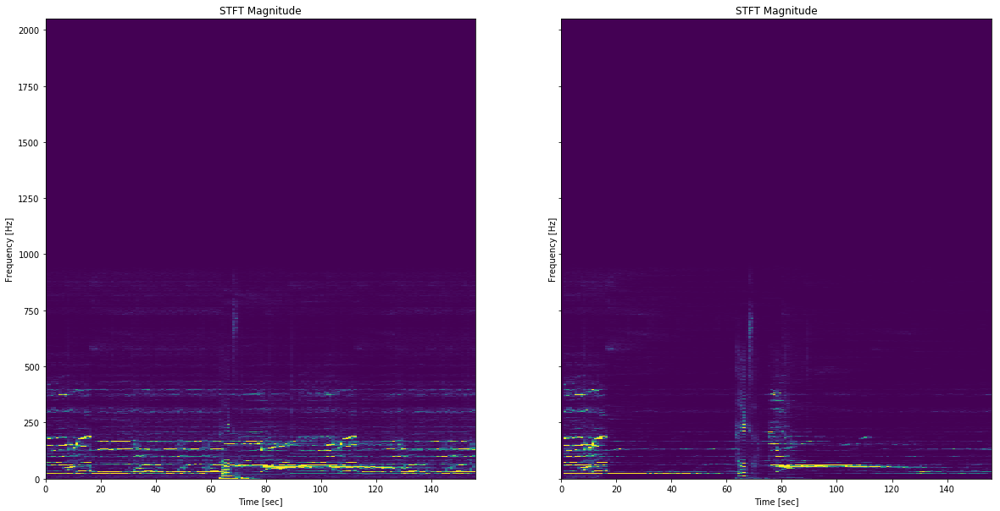

In [52]:
helper.spectrogram(Zxx_0, epsilon, 1/8)

In [53]:
IPython.display.Audio(data = epsilon_time, rate = fs)

# Case 3: Original signals from the recording, and speech on top

# Noise signal

In [54]:
signal_0, signal_1, fs = helper.load_separate_channels(filename)
IPython.display.Audio(data = signal_0, rate = fs)

# Speech signal

In [55]:
speech_signal, _, fs = helper.load_separate_channels(speech_filename)
IPython.display.Audio(data = speech_signal, rate = fs)

This time, we do not touch the original noise, and add the speech on top.

In [56]:
signal_0, signal_1 = processing.add_speech('alexa', signal_0, signal_1, amp=1, position='mid')

Speech added at position mid of the signal.


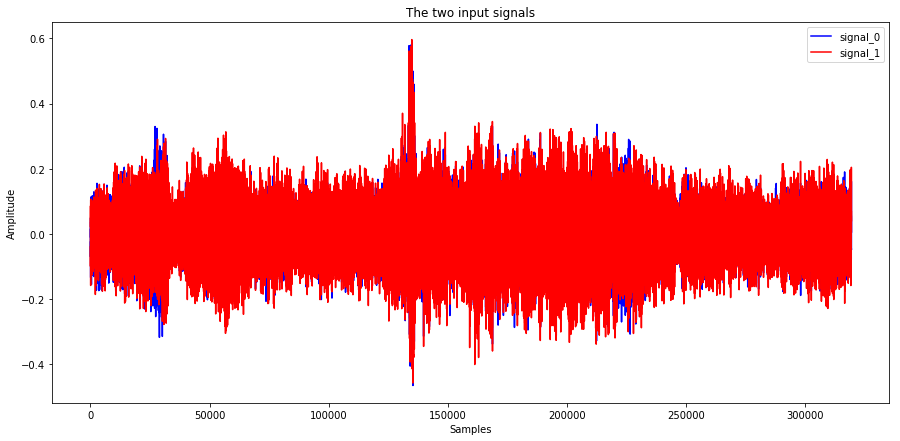

In [57]:
helper.plot_signals(signal_0, signal_1, 'The two input signals', 'signal_0', 'signal_1')

In [58]:
IPython.display.Audio(data = signal_1, rate = fs)

## Short Time Fourier Transform

In [59]:
Zxx_0, Zxx_1, n_freqs, n_frames, hop_length = helper.dual_stft(signal_0, 
                                                               signal_1, 
                                                               window_size=4096, 
                                                               hop_percentage=50)

Number of frames: 156
Frequency resolution: 2049


## STFT domain fast RLS with deferred coefficients

In [60]:
epsilon = algorithms.stft_fast_rls_def_coefs(Zxx_0, Zxx_1, 
                                             d=12, 
                                             filter_length=3, 
                                             f_factor=0.993, 
                                             delta=0.1)

Progress: [####################] 100.0%


In [61]:
epsilon_time = lc.istft(epsilon, hop_length=hop_length)

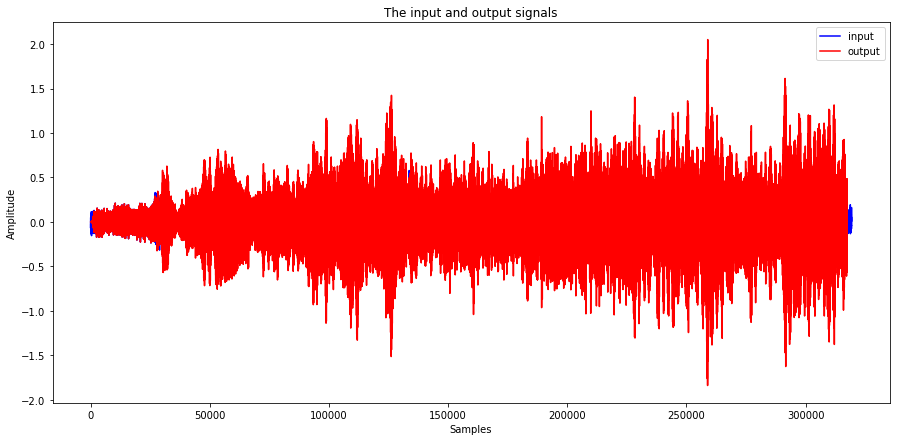

In [62]:
helper.plot_signals(signal_0, epsilon_time, 'The input and output signals', 'input', 'output')

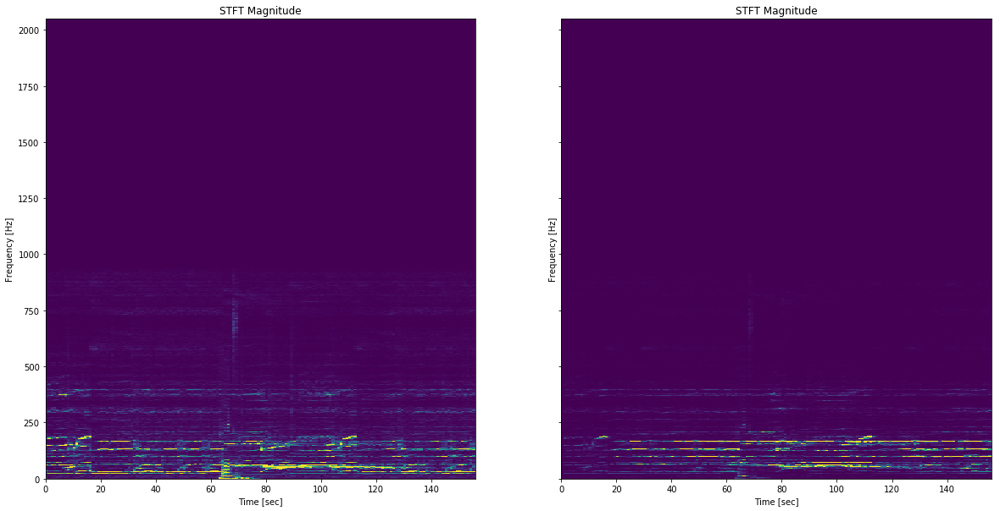

In [63]:
helper.spectrogram(Zxx_0, epsilon, 1/8)

In [64]:
IPython.display.Audio(data = epsilon_time, rate = fs)

# Case 4: Original signals from the recording containing the speech signal

# Noise signal

In [65]:
filename = 'ladida_real'
signal_0, signal_1, fs = helper.load_separate_channels(filename)
IPython.display.Audio(data = signal_0, rate = fs)

This time, the signals already contain the speech signal. Everything was recorded together.

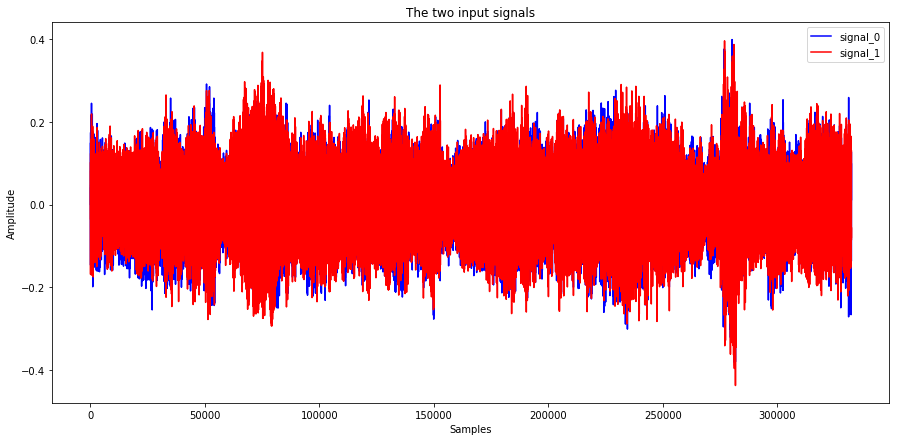

In [66]:
helper.plot_signals(signal_0, signal_1, 'The two input signals', 'signal_0', 'signal_1')

In [67]:
IPython.display.Audio(data = signal_1, rate = fs)

## Short Time Fourier Transform

In [68]:
Zxx_0, Zxx_1, n_freqs, n_frames, hop_length = helper.dual_stft(signal_0, 
                                                               signal_1, 
                                                               window_size=4096, 
                                                               hop_percentage=50)

Number of frames: 163
Frequency resolution: 2049


## STFT domain fast RLS with deferred coefficients

In [69]:
epsilon = algorithms.stft_fast_rls_def_coefs(Zxx_0, Zxx_1, 
                                             d=12, 
                                             filter_length=3, 
                                             f_factor=0.99999, 
                                             delta=0.1)

Progress: [####################] 100.0%


In [70]:
epsilon_time = lc.istft(epsilon, hop_length=hop_length)

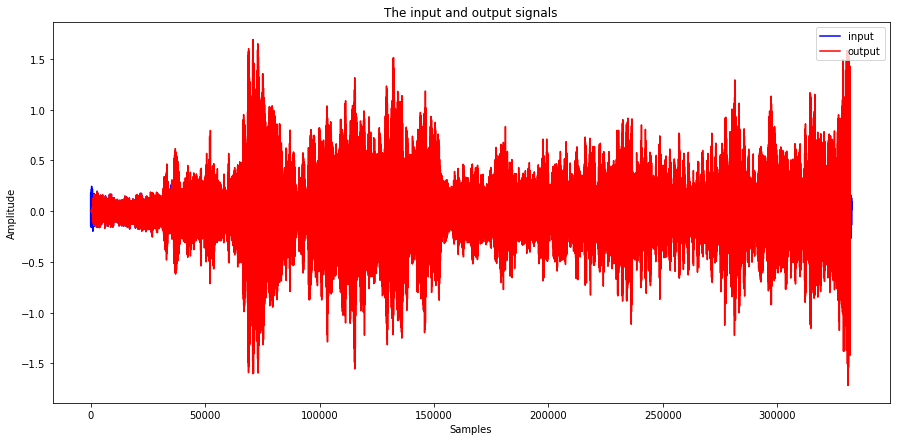

In [71]:
helper.plot_signals(signal_0, epsilon_time, 'The input and output signals', 'input', 'output')

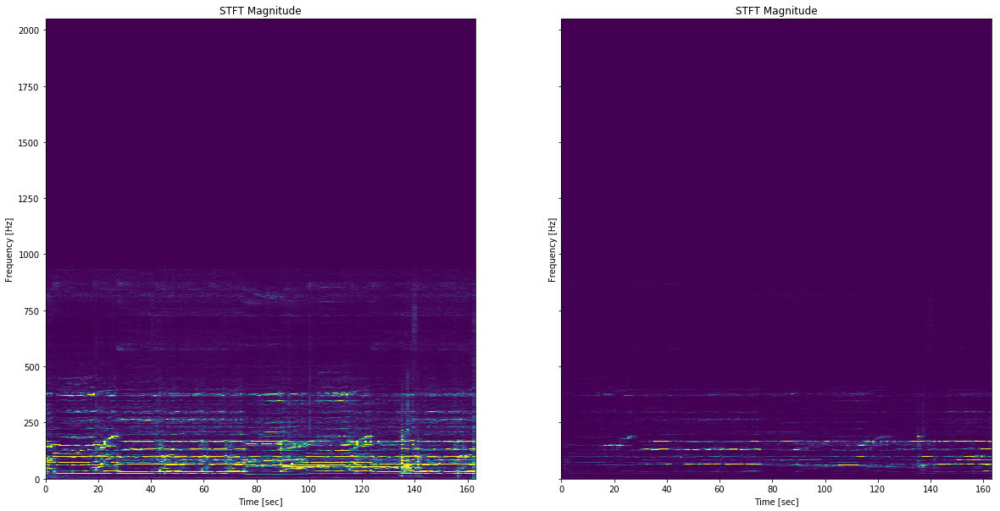

In [72]:
helper.spectrogram(Zxx_0, epsilon, 1/8)

In [73]:
IPython.display.Audio(data = epsilon_time, rate = fs)